# Tier 3
## Cut parameter
With this notebook, the cut parameters for the __TIER3__ processing, namely the baseline cuts on mean, standard deviation and slope as well as some quality plots are generated.

### Initialization
Load all packages. <br>
__ATTENTION__ : Not all loaded packages are needed in this part of the DSP. You can simply exclude packages by commenting out with `#`

In [1]:
import os
os.chdir('/home/ga26tel/legend/l60_r025/cal/dsp/tier3/string1/')

In [2]:
# %load ../../utils/start_pygama.py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import h5py
import glob
from tqdm import tqdm
import os, sys
from pathlib import Path
from numba import jit
from IPython.display import Markdown, display, Latex, Math
import h5py

import libtmux
from sh import tail

from numba import jit, float32

import threading
import multiprocessing
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor
# from pathos.multiprocessing import ProcessPool

plt.rcParams['savefig.dpi'] = 300

plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = 25, 6
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['font.size'] = 16
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = "serif"
plt.rcParams['font.serif'] = "Palatino"
plt.rcParams['legend.fontsize'] = 18
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize'] = 'x-large'
plt.rcParams['ytick.labelsize'] = 'x-large'
plt.ioff

mpl.rcParams['mathtext.fontset'] = 'custom'
# mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath} \usepackage{amssymb} \usepackage{textgreek, upgreek}'
mpl.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
mpl.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
mpl.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import itertools
from itertools import repeat
from itertools import groupby

%config Completer.use_jedi = False

os.environ['PATH'] = os.environ['PATH'] + ':/mnt/atlas01/users/henkes/Software/texlive/2022//bin/x86_64-linux/'
print('INFO: Updated PYTHONPATH to {}'.format(os.environ['PATH']))

print("INFO: Successfully loaded dependencies")

INFO: Updated PYTHONPATH to /mnt/atlas01/users/henkes/Software/miniconda3/bin:/mnt/atlas01/users/henkes/Software/miniconda3/condabin:/home/ga26tel/.vscode-server-insiders/bin/bece5db81842e38bf85e8a08fb1f12b7f78d4384/bin/remote-cli:/usr/local/bin:/usr/bin:/bin:/usr/local/games:/usr/games:/mnt/atlas01/users/henkes/Software/texlive/2022//bin/x86_64-linux/
INFO: Successfully loaded dependencies


### Load relevant information from `config.ini` file
All needed folders, setups etc. are loaded project wise from config file.

In [3]:
# %load utils/config.py
from utils.utils import get_parulaMap

parula_map = get_parulaMap()

from configupdater import ConfigUpdater

class ConfigError(ImportError):
    pass

try:
    config_file
except NameError:    
    config_file = '../../config.ini'

if not os.path.isfile(config_file):
    raise ConfigError('Configuration file config.ini not found in the main directory.')

# Load configuration
config = ConfigUpdater()
config.read(config_file)

# Load default configuration paths
path           = config['DEFAULT']['path'].value
project_folder = config['DEFAULT']['project_folder'].value
folder_raw     = config['FOLDER']['folder_raw'].value

if not os.path.isdir(project_folder):
    raise ConfigError('Project folder {} is not a directory.'.format(project_folder))
if not os.path.isdir(folder_raw):
    raise ConfigError('Folder raw {} is not a directory.'.format(folder_raw))

config_file = project_folder + 'config.ini'
if not os.path.isfile(config_file):
    raise ConfigError('Config file is not in the project folder {}'.format(project_folder))


# Load and initialize folder structure
folder_tier1   = config['FOLDER']['folder_tier1'].value
folder_tier2   = config['FOLDER']['folder_tier2'].value
folder_tier3   = config['FOLDER']['folder_tier3'].value
folder_figures = config['FOLDER']['folder_figures'].value + 'string1/'

# check if output folder exists, if not create folders according to structure
Path(folder_tier1).mkdir(parents=True, exist_ok=True)
Path(folder_tier2).mkdir(parents=True, exist_ok=True)
Path(folder_tier3).mkdir(parents=True, exist_ok=True)
Path(folder_figures).mkdir(parents=True, exist_ok=True)


print("INFO: Loaded project folder: {}".format(project_folder))
print("INFO: Input folder raw data: {}".format(folder_raw))
print("INFO: Output folder tier1: {}".format(folder_tier1))
print("INFO: Output folder tier2: {}".format(folder_tier2))
print("INFO: Output folder tier3: {}".format(folder_tier3))
print("INFO: Output folder figures: {}".format(folder_figures))

# load specific values for Tier3
channel_list, label_list, label_listExt = [], {}, {}
m_calib, n_calib, ftp_calib = {}, {}, {}
for section in config:
    if section.startswith("TIER3/g"):
        if 'String 1' not in config[section]['label_ext'].value:
            continue
        channel = section[-4:]
        channel_list.append(channel)
        label_list[channel] = config[section]['label'].value
        label_listExt[channel] = config[section]['label_ext'].value
        # energy calib
        try:
            m_calib[channel]    = float(config[section]['m_calib'].value)
            n_calib[channel]    = float(config[section]['n_calib'].value)
            ftp_calib[channel]  = int(config[section]['ftp'].value)
        except:
            print('INFO: No energy calibration values found for channel {}'.format(channel))
        
                
print("\nINFO: Found channel list TIER3 String 1: {}".format(channel_list))
print("\nINFO: Found label list TIER3 String 1")
print("{:<8} {:<10} {:<15}".format('channel','label','ext. label'))
for ch, label in label_list.items():
    print("{:<8} {:<10} {:<15}".format(ch, label, label_listExt[ch]))

try:
    intrace_cut_value = int(config['TIER3']['intrace_cut_value'].value)
    numtraces_cut_value = int(config['TIER3']['numtraces_cut_value'].value)
    tau_cut_value = int(config['TIER3']['tau_cut_value'].value)
    risetime1090_cut_value = int(config['TIER3']['risetime1090_cut_value'].value)
except:
    raise ConfigError('Cut values have to be integer to be a integer.')

INFO: Loaded project folder: /home/ga26tel/legend/l60_r025/cal/dsp/
INFO: Input folder raw data: /mnt/atlas01/users/henkes/l60_r025/cal/raw/
INFO: Output folder tier1: /mnt/atlas01/users/henkes/l60_r025/cal/tier1/
INFO: Output folder tier2: /mnt/atlas01/users/henkes/l60_r025/cal/tier2_full/
INFO: Output folder tier3: /mnt/atlas01/users/henkes/l60_r025/cal/tier3/
INFO: Output folder figures: /mnt/atlas01/users/henkes/l60_r025/cal/figures/string1/

INFO: Found channel list TIER3 String 1: ['g034', 'g035', 'g036', 'g037', 'g038', 'g039', 'g040', 'g027']

INFO: Found label list TIER3 String 1
channel  label      ext. label     
g034     02160A     02160A (ICPC) at String 1 (Pos 1)
g035     02162B     02162B (ICPC) at String 1 (Pos 2)
g036     04545A     04545A (ICPC) at String 1 (Pos 3)
g037     05266A     05266A (ICPC) at String 1 (Pos 4)
g038     05268B     05268B (ICPC) at String 1 (Pos 5)
g039     052612A    052612A (ICPC) at String 1 (Pos 6)
g040     07302B     07302B (ICPC) at String

### Define `figures folder`

In [4]:
folder_figures_aoe = folder_figures + 'aoe/'
Path(folder_figures_aoe).mkdir(parents=True, exist_ok=True)

## Load data
First, the __TIER2__ data is loaded from the stored `.lh5` files. Therefore, all variables are read from the files for all channels and stored in variables.

In [5]:
infiles = sorted(glob.glob(folder_tier2 + "*lh5"))

print('INFO: Loading data.')
# Load data from HDF5 files
timestamp = {}
timestamp_cor = {}
t0 = {}
t_drift = {}
blfadc = {}
blmean = {}
blrms = {}
blslope = {}
pretrace_diff = {}
intrace_counter = {}
evtID_fadc = {}
numtraces = {}
energy_amp = {}
energy_ftp_434 = {}
energy_ftp_848 = {}
energy_ftp_10210 = {}
energy_ftp_10410 = {}
energy_fadc = {}
amplitude = {}
amplitude_diff = {}
risetime1090 = {}
tau = {}
slope = {}
slope_pz = {}
qdrift = {}

for j in tqdm(channel_list):
    timestamp_i = []
    timestamp_cor_i = []
    t0_i = []
    t_drift_i = []
    blfadc_i = []
    blmean_i = []
    blrms_i = []
    blslope_i = []
    pretrace_diff_i = []
    intrace_counter_i = []
    evtID_fadc_i = []
    numtraces_i = []
    energy_amp_i = []
    energy_ftp_434_i = []
    energy_ftp_848_i = []
    energy_ftp_10210_i = []
    energy_ftp_10410_i = []
    energy_fadc_i = []
    amplitude_i = []
    amplitude_diff_i = []
    risetime1090_i = []
    tau_i = []
    slope_i = []
    slope_pz_i = []
    qdrift_i = []

    # j = detector_arr

    n_files = len(infiles)
    for elem in infiles:
        with h5py.File(elem, "r") as data:
            if len(data.keys()) != 28:
                n_files -= 1
                continue
            timestamp_i.append(data[j+'/timestamp'][:])
            t0_i.append(data[j+'/t0'][:])
            t_drift_i.append(data[j+'/t_drift'][:])
            blfadc_i.append(data[j+'/baseline_fadc'][:])
            blmean_i.append(data[j+'/blmean'][:])
            blrms_i.append(data[j+'/blstd'][:])
            blslope_i.append(data[j+'/blfit'][:])
            pretrace_diff_i.append(data[j+'/pretrace_diff'][:])
            intrace_counter_i.append(data[j+'/intrace_counter'][:])
            evtID_fadc_i.append(data[j+'/evtID_fadc'][:])
            numtraces_i.append(data[j+'/numtraces'][:])
            energy_amp_i.append(data[j+'/energy_amp'][:])
            energy_ftp_434_i.append(data[j+'/e_ftp_434'][:])
            energy_ftp_848_i.append(data[j+'/e_ftp_848'][:])
            energy_ftp_10210_i.append(data[j+'/e_ftp_10210'][:])
            energy_ftp_10410_i.append(data[j+'/e_ftp_10410'][:])
            energy_fadc_i.append(data[j+'/energy_fadc'][:])
            amplitude_i.append(data[j+'/amplitude'][:])
            amplitude_diff_i.append(data[j+'/amplitude_diff'][:])
            risetime1090_i.append(data[j+'/risetime1090'][:])
            tau_i.append(data[j+'/tau'][:])
            slope_i.append(data[j+'/slope'][:])
            slope_pz_i.append(data[j+'/slope_pz'][:])
            qdrift_i.append(data[j+'/qdrift'][:])

    # Corrected timestamp (chain stamps of various files)
    for elem in range(n_files):
        if elem == 0:
            ts_cor = timestamp_i[elem]
        else:
            ts_cor = timestamp_i[elem] + sum(timestamp_i[elem-j][-1] for j in range(1,elem+1,1))
        timestamp_cor_i.append(ts_cor)

    timestamp[j] = np.concatenate(timestamp_i[:])
    timestamp_cor[j] = np.concatenate(timestamp_cor_i[:])
    t0[j] = np.concatenate(t0_i[:])
    t_drift[j] = np.concatenate(t_drift_i[:])
    blfadc[j] = np.concatenate(blfadc_i[:])
    blmean[j] = np.concatenate(blmean_i[:])
    blrms[j] = np.concatenate(blrms_i[:])
    blslope[j] = np.concatenate(blslope_i[:])
    pretrace_diff[j] = np.concatenate(pretrace_diff_i[:])
    intrace_counter[j] = np.concatenate(intrace_counter_i[:])
    evtID_fadc[j] = np.concatenate(evtID_fadc_i[:])
    numtraces[j] = np.concatenate(numtraces_i[:])
    energy_amp[j] = np.concatenate(energy_amp_i[:])
    energy_ftp_434[j] = np.concatenate(energy_ftp_434_i[:])
    energy_ftp_848[j] = np.concatenate(energy_ftp_848_i[:])
    energy_ftp_10210[j] = np.concatenate(energy_ftp_10210_i[:])
    energy_ftp_10410[j] = np.concatenate(energy_ftp_10410_i[:])
    energy_fadc[j] = np.concatenate(energy_fadc_i[:])
    amplitude[j] = np.concatenate(amplitude_i[:])
    amplitude_diff[j] = np.concatenate(amplitude_diff_i[:])
    risetime1090[j] = np.concatenate(risetime1090_i[:])
    tau[j] = np.concatenate(tau_i[:])
    slope[j] = np.concatenate(slope_i[:])
    slope_pz[j] = np.concatenate(slope_pz_i[:])
    qdrift[j] = np.concatenate(qdrift_i[:])
    

print('INFO: Finished loading data.')

INFO: Loading data.


100%|██████████| 8/8 [00:50<00:00,  6.30s/it]

INFO: Finished loading data.


## Load the cuts
The cuts for the data are loaded and applied.

In [6]:
intrace_cut, tau_cut, risetime1090_cut, qdrift_cut = {}, {}, {}, {}
blmean_cut, blrms_cut, blslope_cut = {}, {}, {}
drift_time_cut = {}
energy_ftp_cut, energy_ftp = {}, {}


for section in config:
    if section.startswith("TIER3/g"):
        channel = section[-4:]
        if channel not in channel_list:
            continue
        try:
            ftp_val = ftp_calib[channel]
        except:
            print('ERROR: No calibration values for channel {}'.format(channel))
            channel_list.pop(channel_list.index(channel))
            continue
            
            
        # Reject intrace pile-up events with intrace counter generated from tier2 PSD
        intrace_cut[channel] = np.equal(intrace_counter[channel], intrace_cut_value)

        # only accept physics events (Physics: 1, Pulser: 17, Multiplicity: 2, Trash: 48)
        numtraces_cut = np.equal(numtraces[channel], numtraces_cut_value)

        # reject decay time < 10 mus 
        tau_cut[channel] = np.greater(tau[channel], tau_cut_value)

        # QDrift, risetime and energies > 0 --> exclude wrong trigger events 
        risetime1090_cut[channel] = np.greater(risetime1090[channel], risetime1090_cut_value)
        qdrift_cut[channel] = np.greater(qdrift[channel], 0)
        
        # load ftp energy values
        if ftp_calib[channel] == 434:
            energy_ftp[channel] = energy_ftp_434[channel]
            energy_ftp_cut[channel] = np.greater(energy_ftp_434[channel], 0)
        elif ftp_calib[channel] == 848:
            energy_ftp[channel] = energy_ftp_848[channel]
            energy_ftp_cut[channel] = np.greater(energy_ftp_848[channel], 0)
        elif ftp_calib[channel] == 10210:
            energy_ftp[channel] = energy_ftp_10210[channel]
            energy_ftp_cut[channel] = np.greater(energy_ftp_10210[channel], 0)
        elif ftp_calib[channel] == 10410:
            energy_ftp[channel] = energy_ftp_10410[channel]
            energy_ftp_cut[channel] = np.greater(energy_ftp_10410[channel], 0)
        
        blmean_ch = blmean[channel]
        blrms_ch = blrms[channel]
        blslope_ch = blslope[channel]
        t_drift_ch = t_drift[channel]
        f0_mean, f1_mean = float(config[section]['f0_mean'].value) , float(config[section]['f1_mean'].value)
        blmean_cut[channel] = np.logical_and(blmean_ch >= f1_mean, blmean_ch <= f0_mean)
        f0_rms, f1_rms = float(config[section]['f0_rms'].value) , float(config[section]['f1_rms'].value)
        blrms_cut[channel] = np.logical_and(blrms_ch >= f1_rms, blrms_ch <= f0_rms)
        f0_slope, f1_slope = float(config[section]['f0_slope'].value) , float(config[section]['f1_slope'].value)
        blslope_cut[channel] = np.logical_and(blslope_ch >= f1_slope, blslope_ch <= f0_slope)
        pulser_cut_right, pulser_cut_left = float(config[section]['pulser_cut_right'].value) , float(config[section]['pulser_cut_left'].value)
        drift_time_cut[channel] = ~np.logical_and(t_drift_ch < pulser_cut_right, t_drift_ch > pulser_cut_left)

In [7]:
energy_ftp_noCalib, energy_ftp_calib, amplitude_aftercuts, aoe, final_cut, tot_surrivProb = {}, {}, {}, {}, {}, {}
print('Total surrival probability')
for i, channel in enumerate(channel_list):
    # full cut
    final_cut[channel] = np.logical_and.reduce(np.array((energy_ftp_cut[channel], blmean_cut[channel], blrms_cut[channel], blslope_cut[channel], intrace_cut[channel], drift_time_cut[channel], risetime1090_cut[channel], tau_cut[channel], qdrift_cut[channel])))
    # simple cut
    # final_cut[ftp][channel] = np.logical_and.reduce(np.array((blmean_cut[channel], blrms_cut[channel], blslope_cut[channel], energy_ftp_cut[ftp][channel])))
    # full cut without pulser
    # final_cut[ftp][channel] = np.logical_and.reduce(np.array((energy_ftp_cut[ftp][channel], blmean_cut[channel], blrms_cut[channel], blslope_cut[channel], intrace_cut[channel], risetime1090_cut[channel], tau_cut[channel], qdrift_cut[channel])))

    # generate cut on energy
    energy_ftp_noCalib[channel]   = energy_ftp[channel][final_cut[channel]]
    # load calibrated energy
    energy_ftp_calib[channel]     = m_calib[channel] * energy_ftp_noCalib[channel] + n_calib[channel]
    # load current amplitude
    amplitude_aftercuts[channel]        = amplitude_diff[channel][final_cut[channel]]
    # generate A over E values with calibrated energies from above
    aoe[channel]                  = amplitude_diff[channel][final_cut[channel]] / energy_ftp_calib[channel]
    # calculate surrival fraction for channel
    tot_surrivProb[channel]       = np.count_nonzero(final_cut[channel]) / len(final_cut[channel]) * 100
        
    print('- {}: {:5.2f}% | ftp: {:<5} | m_calib: {:5.3f} | n_calib: {:5.3f}'.format(channel, tot_surrivProb[channel],  ftp_calib[channel], m_calib[channel], n_calib[channel]))

Total surrival probability
- g034: 73.69% | ftp: 848   | m_calib: 0.151 | n_calib: -0.098
- g035: 70.47% | ftp: 10410 | m_calib: 0.154 | n_calib: -1.060
- g036: 63.36% | ftp: 10210 | m_calib: 0.152 | n_calib: 0.133
- g037: 75.07% | ftp: 10210 | m_calib: 0.146 | n_calib: 0.358
- g038: 71.00% | ftp: 848   | m_calib: 0.142 | n_calib: -0.006
- g039: 70.41% | ftp: 10210 | m_calib: 0.156 | n_calib: -0.344
- g040: 77.93% | ftp: 10410 | m_calib: 0.152 | n_calib: 0.028
- g027: 63.07% | ftp: 10410 | m_calib: 0.151 | n_calib: 0.095


## PSD
To start the PSD generation, first load `util` functions and first load peak values.

In [8]:
from utils.utils import gauss, psa_fit, sigma_fit, linear_func, exp_func, constant, cauchy

dep_line = 1592.511 # DEP peak line 

dep_acc = 0.9 # surrival effiency to be tuned in the DEP peak

q_bb = 2039.04 # Q beta beta

# according to Flos values from peaks possible, maybe to change to better values
peaks_of_interest   = [583.187, 860.557, 1620.5] #238.4, 300.087, 2039
peaks_SEP       = 2103.511
peaks_FEP       = 2614.511


def fwhm_fit(x, a, b):
    return np.sqrt(a+b*x)

fwhm_dep_all, fwhm_fep_all, fwhm_sep_all, fwhm_qbb_all = {}, {}, {}, {}
for channel in channel_list:
    popt_fwhm = [float(config['TIER3/' + channel]['popt_fwhm0'].value), float(config['TIER3/' + channel]['popt_fwhm1'].value)]
    fwhm_dep_all[channel], fwhm_fep_all[channel], fwhm_sep_all[channel], fwhm_qbb_all[channel] = fwhm_fit(dep_line, *popt_fwhm), fwhm_fit(peaks_FEP, *popt_fwhm), fwhm_fit(peaks_SEP, *popt_fwhm), fwhm_fit(q_bb, *popt_fwhm)    
    print('- {}: DEP - {:.2f}keV | SEP - {:.2f}keV | Qbb - {:.2f}keV | FEP - {:.2f}keV'.format(channel, fwhm_dep_all[channel], fwhm_sep_all[channel], fwhm_qbb_all[channel], fwhm_fep_all[channel]))

- g034: DEP - 2.12keV | SEP - 2.32keV | Qbb - 2.29keV | FEP - 2.49keV
- g035: DEP - 6.97keV | SEP - 7.99keV | Qbb - 7.87keV | FEP - 8.89keV
- g036: DEP - 3.17keV | SEP - 3.17keV | Qbb - 3.17keV | FEP - 3.17keV
- g037: DEP - 2.79keV | SEP - 3.11keV | Qbb - 3.08keV | FEP - 3.41keV
- g038: DEP - 2.43keV | SEP - 2.65keV | Qbb - 2.63keV | FEP - 2.86keV
- g039: DEP - 3.87keV | SEP - 4.25keV | Qbb - 4.21keV | FEP - 4.61keV
- g040: DEP - 2.01keV | SEP - 2.27keV | Qbb - 2.24keV | FEP - 2.50keV
- g027: DEP - 2.38keV | SEP - 2.72keV | Qbb - 2.68keV | FEP - 3.02keV


### AoE correction
Correct linear dependence in compton scattered single site events (SCS events). First, multiple bands inside the compton band are predefined according to predefined values (`comptBands`). Secondly, the bands are fitted according to
\begin{equation}
f(A/E) = \frac{A}{\sigma_{SCS} \cdot \sqrt{2 \pi}} \cdot \exp\left(- \frac{(E - \mu_{SCS})^2}{2 \sigma_{SCS}^2}\right) + B \cdot \frac{\exp(k (E - l)) + d}{\exp((E - l)/ t ) + 1}
\end{equation}
which is the sum of Gaussian and an empirically found modeling of a low-energy tail. The resulting $\mu_{SCS}$ and $\sigma_{SCS}$ are stored in the variable `compt_aoe` and `compt_sig` for further processing.


In [9]:
%notebook inline
from scipy.optimize import curve_fit
from lmfit import Model
import warnings

warnings.filterwarnings('ignore')

# Width of SCS bands in keV
comptBands_width = 20

# PSA fit
def psa_fit_gauss(x, mu, sigma, A):
    f = A/(sigma*np.sqrt(2*np.pi)) * np.exp(-(x-mu)**2/(2.*sigma**2))
    return f
# PSA fit tail
def psa_fit_tail(x, B, k, l, d, t):
    f = B * ((np.exp(k*(x-l))+d) / (np.exp((x-l)/t)+1))
    return f

# SCS energy values
comptBands = np.array([#255, 340, 360, 380, 400, 420, 460, 480, 
                        520, 555, 590, 610, 630, 650, 670, 690, 
                        735, 790, 810, 830, 865, 900, 930, 955,
                        1000, 1020, 1040, 1130, 1150, 1170, 1190, 
                        1210, 1250, 1270, 1290, 1310, 1330, 1420,
                        1520, 1540, 1700, 1780, 1810, 1850, 1870,
                        1890, 1910, 1930, 1950, 1970, 1990, 2010,
                        2030, 2050, 2150])
compt_aoe_bands = {}
compt_sig_bands = {}
compt_aoe     = {}
# compt_aoe_err = {}
compt_sig     = {}
# compt_sig_err = {}

    
for channel in channel_list:
    # if channel != 'g035':
    #     continue
    compt_aoe_ch     = []
    # compt_aoe_err_ch = []
    compt_sig_ch     = []
    # compt_sig_err_ch = []


    n_rows, n_cols = 10, 5
    fig_compton, axes_compton = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))
    axes_compton = axes_compton.flatten()

    n_bins = 250

    e_cal_ch  = energy_ftp_calib[channel]
    aoe_ch    = aoe[channel]
    
    for i, band in enumerate(comptBands):
        # if i > 34:
        #     n_bins = 180
        aoe_ch_band_cut = np.logical_and(e_cal_ch>band, e_cal_ch<band+comptBands_width)
        aoe_ch_band     = aoe_ch[aoe_ch_band_cut]
        
        # n_aoe_tmp, bins_aoe_tmp, _ = axes[i].hist(aoe_tmp, bins=n_bins, align='mid', histtype='step', label='data', color='b', log=True)
        n_aoe_band, bins_aoe_band = np.histogram(aoe_ch_band, bins=n_bins, range=(0.001, 0.6))        
        bins_aoe_band = (bins_aoe_band[:-1] + bins_aoe_band[1:]) / 2
        x_fit = np.linspace(0.01, 0.6, 10000)
        
        axes_compton[i].plot(bins_aoe_band, n_aoe_band, label=f'{channel} -- Compton region: ' + str(band) + ' keV')

        try:
            # first: gauss fit for parameter guess
            p_0 = [bins_aoe_band[np.argmax(n_aoe_band)], 1e-3, np.max(n_aoe_band)]
            p_0_cut = np.logical_and(bins_aoe_band > bins_aoe_band[np.argmax(n_aoe_band)] - 0.02, bins_aoe_band < bins_aoe_band[np.argmax(n_aoe_band)] + 0.02)
            pars0, _ = curve_fit(gauss, bins_aoe_band[p_0_cut], n_aoe_band[p_0_cut], p0=p_0, maxfev=10000)
            axes_compton[i].plot(x_fit, gauss(x_fit, *pars0), '-', color='green', label='Gauss start')

            # second: tail fit for parameter guess
            p_1 = [80, 10, pars0[0]-pars0[1], -0.1, 0.1]              
            tail_cut = ~np.logical_and(bins_aoe_band > bins_aoe_band[np.argmax(n_aoe_band)] - 0.15, bins_aoe_band < bins_aoe_band[np.argmax(n_aoe_band)] + 0.15)
            if channel == 'g035':
                tail_cut = ~np.logical_and(bins_aoe_band > bins_aoe_band[np.argmax(n_aoe_band)] - 0.035, bins_aoe_band < bins_aoe_band[np.argmax(n_aoe_band)] + 0.035)
            
            pars1, _ = curve_fit(psa_fit_tail, bins_aoe_band[tail_cut], n_aoe_band[tail_cut], p0=p_1, maxfev = 120000)
            axes_compton[i].plot(x_fit, psa_fit_tail(x_fit, *pars1), '-', color='green', label='tail start')
            
            # curve fit
            # mu, sigma, A, B, k, l, d, t
            # p_0 = np.concatenate([pars0, pars1])
            # max_deviation = 0.3
            # lower_bounds, upper_bounds = p_0 - max_deviation*p_0, p_0 + max_deviation*p_0
            # upper_bounds[2] = np.max(n_aoe_band)*0.8
            # bounds = [lower_bounds, upper_bounds]
            # pars, cov = curve_fit(psa_fit, bins_aoe_band, n_aoe_band, p0=p_0, maxfev=10000)#, bounds=bounds)
            # # print(pars[-1])
            # errs = np.sqrt(np.diag(cov))
            # compt_aoe_ch.append(pars[0])
            # compt_aoe_err_ch.append(pars[1])
            # compt_sig_ch.append(errs[0])
            # compt_sig_err_ch.append(errs[1])
            
            # lmfit
            # mu, sigma, A, B, k, l, d, t
            p_0 = np.concatenate([pars0, pars1])
            model_psa_fit = Model(psa_fit)
            params_psa_fit = model_psa_fit.make_params(mu=p_0[0], sigma=p_0[1], A=p_0[2], B=p_0[3], k=p_0[4], l=p_0[5], d=p_0[6], t=p_0[7])
            # params_psa_fit = model_psa_fit.make_params()
            # params_psa_fit.add('max_A', value=0.5*np.max(n_aoe_band), max=0.5*np.max(n_aoe_band), vary=True, expr='A/sigma')
            # params_psa_fit.add('A', value=p_0[2], expr='max_A - A/sigma')
            # print(f'parameter names: {gmodel.param_names}')
            # print(f'independent variables: {gmodel.independent_vars}')
            out_psa_fit = model_psa_fit.fit(n_aoe_band, x=bins_aoe_band, params=params_psa_fit)
            # print(out.fit_report())
            # print(out.best_values)
            compt_aoe_ch.append(out_psa_fit.best_values['mu'])
            # compt_aoe_err_ch.append(pars[1])
            compt_sig_ch.append(out_psa_fit.best_values['sigma'])
            # compt_sig_err_ch.append(errs[1])

            # Plot AoE histogram fits
            axes_compton[i].plot(x_fit, out_psa_fit.eval(x=x_fit), '-', color='red', label='full fit')
            # axes_compton[i].plot(x_fit, psa_fit_gauss(x_fit, *pars[:3]), '-', color='blue', label='Gauss fit')
            # axes_compton[i].plot(x_fit, psa_fit_tail(x_fit, *pars[3:]), '-', color='orange', label='tail fit')
        except:
            print(f'Failed fit {band} for channel {channel}')
            compt_aoe_ch.append(0)
            # compt_aoe_err_ch.append(0)
            compt_sig_ch.append(0)
            # compt_sig_err_ch.append(0)
            
        axes_compton[i].legend()
        axes_compton[i].set_xlabel("$A/E_{\mathrm{unc}}$ (a.u.)")
        axes_compton[i].set_ylabel("Counts")
        # axes_compton[i].set_xlim(0.01, 0.6)
        axes_compton[i].set_xlim(bins_aoe_band[np.argmax(n_aoe_band)]-0.1, bins_aoe_band[np.argmax(n_aoe_band)]+0.1)
        axes_compton[i].set_ylim(-5, 1.2*np.max(n_aoe_band))
    
    compt_aoe_ch        = np.array(compt_aoe_ch)
    # compt_aoe_err_ch    = np.array(compt_aoe_err_ch)    
    compt_sig_ch        = np.array(compt_sig_ch)
    # compt_sig_err_ch    = np.array(compt_sig_err_ch)
    
    compt_aoe_bands[channel] = comptBands[compt_aoe_ch != 0]
    # compt_aoe_err[channel]   = compt_aoe_err_ch[~np.isfinite(compt_aoe_ch) == 0]
    compt_aoe[channel]       = compt_aoe_ch[compt_aoe_ch != 0]
    
    compt_sig_bands[channel] = comptBands[compt_sig_ch != 0]
    # compt_sig_err[channel]   = compt_sig_err_ch[~np.isfinite(compt_sig_ch) == 0]
    compt_sig[channel]       = compt_sig_ch[compt_sig_ch != 0]
    
    axes_compton[-1].remove()
    axes_compton[-2].remove()
    axes_compton[-3].remove()
    fig_compton.tight_layout()
    fig_compton.savefig(folder_figures_aoe + f'{channel}_comptonBands_AllFits.pdf')
    plt.close(fig_compton)
    
    print(f'Finished channel {channel}')
    
    

    # break

Failed fit 1520 for channel g034
Finished channel g034
Failed fit 590 for channel g035
Failed fit 610 for channel g035
Failed fit 670 for channel g035
Failed fit 690 for channel g035
Failed fit 735 for channel g035
Failed fit 810 for channel g035
Failed fit 1130 for channel g035
Failed fit 1190 for channel g035
Failed fit 1250 for channel g035
Failed fit 1270 for channel g035
Failed fit 1290 for channel g035
Failed fit 1310 for channel g035
Failed fit 1520 for channel g035
Failed fit 1780 for channel g035
Failed fit 1950 for channel g035
Failed fit 2050 for channel g035
Failed fit 2150 for channel g035
Finished channel g035
Failed fit 1000 for channel g036
Failed fit 2010 for channel g036
Failed fit 2050 for channel g036
Finished channel g036
Failed fit 650 for channel g037
Failed fit 830 for channel g037
Finished channel g037
Failed fit 690 for channel g038
Failed fit 1870 for channel g038
Finished channel g038
Failed fit 1210 for channel g039
Failed fit 1810 for channel g039
Failed f

In [10]:
# from scipy.signal import savgol_filter 

# plt.plot(bins_aoe_band, n_aoe_band, label='Compton region: ' + str(band) + ' keV')
# # plt.plot(x_fit, psa_fit(x_fit, *[0.42886235, 0.0052311 , 1.77600217, 4.22538609e+01,  1.83184775e+01,  4.21498464e-01, -2.33799150e-02, 2.37225588e-3]), '-', color='red', label='full fit')
# # plt.plot(x_fit, psa_fit(x_fit, *pars), '-', color='red', label='full fit')
# # plt.plot(x_fit, psa_fit_gauss(x_fit, *pars0), '-', color='blue', label='Gauss fit')
# # plt.plot(x_fit, psa_fit_tail(x_fit, *[1.17321232e+02, 2.83131094e+01, 4.22910825e-01, 1.46638720e-02, 2.94754223e-03]), '-', color='orange', label='tail fit')
# p_0 = np.concatenate([pars0, pars1])
# # print(p_0)
# # # np_inf = np.inf
# # max_deviation = 0.3
# # # bounds = [p_0 - max_deviation*p_0, p_0 + max_deviation*p_0]
# # lower_bounds, upper_bounds = p_0 - max_deviation*p_0, p_0 + max_deviation*p_0
# # upper_bounds[2] = np.max(n_aoe_band)*0.8
# # bounds = [lower_bounds, upper_bounds]
# # pars, cov = curve_fit(psa_fit, bins_aoe_band, n_aoe_band, p0=p_0, bounds=bounds, maxfev=10000)#, bounds=bounds)
# from lmfit import Model

# gmodel = Model(psa_fit)
# print(f'parameter names: {gmodel.param_names}')
# print(f'independent variables: {gmodel.independent_vars}')
# params = gmodel.make_params(mu=p_0[0], sigma=p_0[1], A=p_0[2], B=p_0[3], k=p_0[4], l=p_0[5], d=p_0[6], t=p_0[7])
# out = gmodel.fit(n_aoe_band, x=bins_aoe_band, params=params)
# print(out.fit_report())
# # print(out.conf_interval())
# # print(out.best_values['mu'])
# dely = out.eval_uncertainty(sigma=3)
# # print(len(dely))
# # plt.plot(bins_aoe_band, out.best_fit, color='g', label='lmfit')
# # print(out.eval(x=np.linspace(0.01, 0.6, 10000)))
# plt.plot(x_fit, out.eval(x=x_fit), color='g', label='lmfit')
# plt.fill_between(bins_aoe_band, out.eval(x=bins_aoe_band)-dely, out.eval(x=bins_aoe_band)+dely, color="#ABABAB",
#                  label='3-$\sigma$ uncertainty band')
# # p_0 = [80, 10, pars0[0]-pars0[1], -0.1, 0.1]
# # tail_cut = ~np.logical_and(bins_aoe_band > 0.4, bins_aoe_band < 0.46)
# # p, _ = curve_fit(psa_fit_tail, bins_aoe_band[tail_cut], n_aoe_band[tail_cut], p0=p_0, maxfev=100000)
# # plt.plot(x_fit, psa_fit_tail(x_fit, *p), '-', color='orange', label='tail fit')
# # plt.plot(bins_aoe_band, savgol_filter(n_aoe_band, 9, 3), label='savgol Compton region: ' + str(band) + ' keV')
# # y_fit = psa_fit(x_fit, *pars)
# # y_fit_current = np.diff(y_fit, prepend=y_fit[0])
# # plt.plot(x_fit, y_fit_current)
# plt.legend()
# plt.xlim(0.35, 0.5)
# # psa_fit_tail(x, B, k, l, d, t):
# # pars[3:]
# pars[:3]
# pars0

Afterwards, the centroids of the compton continuum is fitted with a linear function to correct for the linear dependence of the A/E parameter for the SCS events. Here, the Gaussian means $\mu_{SCS}$ are plotted as a function of the energy values $E_{SCS}$. These tuples show clearly a linear dependence which has to be corrected.  
That's why the linear function 
\begin{equation}
\mu_{SCS} (E_{SCS}) = \mu_{SCS}' + a \cdot E_{SCS}
\end{equation}
is fitted to the data points.

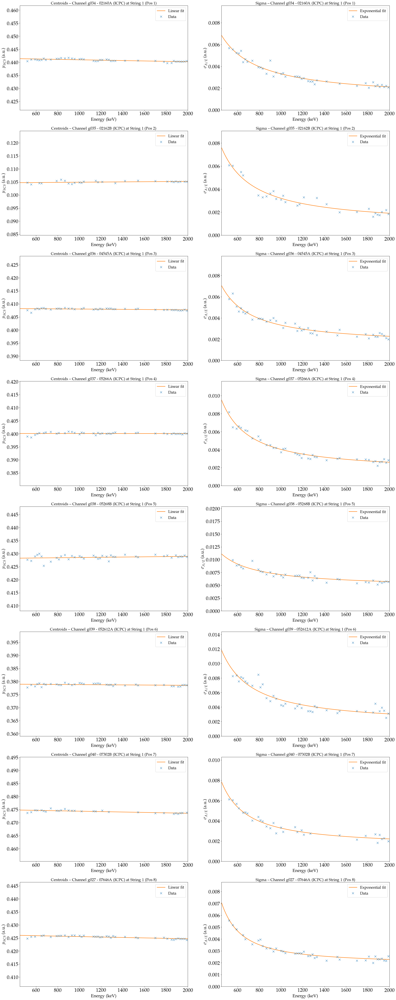

In [11]:
pars_aoe_norm, pars_aoe_sig = {}, {}

fig_centroids, axes_centroids = plt.subplots(len(channel_list), 2, figsize=(30, 10*len(channel_list)))

for i, channel in enumerate(channel_list):
    # if channel != 'g040':
    #     continue
    
    axes = axes_centroids[i]
    compt_aoe_bands_ch    = compt_aoe_bands[channel]
    compt_aoe_ch          = compt_aoe[channel]
    compt_aoe_bands_ch = compt_aoe_bands_ch[np.logical_and(compt_aoe_ch > 0, compt_aoe_ch < 2)]
    compt_aoe_ch       = compt_aoe_ch[np.logical_and(compt_aoe_ch > 0, compt_aoe_ch < 2)]
    
    compt_sig_ch = compt_sig[channel]
    compt_sig_bands_ch = compt_sig_bands[channel]
    
    compt_sig_bands_ch = compt_sig_bands_ch[np.logical_and(compt_sig_ch > 0, compt_sig_ch < 1e-2)] 
    compt_sig_ch       = compt_sig_ch[np.logical_and(compt_sig_ch > 0, compt_sig_ch < 1e-2)]
    # Fit SCS centroids with linear function
    pars, cov = curve_fit(linear_func, compt_aoe_bands_ch, compt_aoe_ch)
    errs = np.sqrt(np.diag(cov))

    
        

    # Plot SCS centroids versus E and linear fit
    x_fit = np.linspace(0, 3000, 3000)
    axes[0].errorbar(compt_aoe_bands_ch, compt_aoe_ch, yerr=None, xerr=None, label='Data', ecolor='r', elinewidth=0.5, capthick=1.5, fmt="x")
    axes[0].plot(x_fit, linear_func(x_fit, *pars), label='Linear fit')
    axes[0].legend()#title='AoE energy dependence'
    axes[0].set_xlabel("Energy (keV)")
    axes[0].set_ylabel("$\mu_{SCS}$ (a.u.)")
    axes[0].set_ylim(pars[1]-0.02, pars[1]+0.02)
    axes[0].set_xlim(450, 2000)
    # axes[0].set_ylim(0)
    axes[0].set_title('Centroids -- Channel {} - {}'.format(channel, label_listExt[channel]))

    # Fit sigmas with exp func
    # compt_sig_ch_cut = np.where(compt_sig_ch < 5e-3)
    # compt_sig_bands_ch, compt_sig_ch, compt_sig_err_ch = compt_sig_bands_ch[compt_sig_ch_cut], compt_sig_ch[compt_sig_ch_cut], compt_sig_err_ch[compt_sig_ch_cut]
    # # compt_sig_ch_cut = np.logical_or(compt_sig_bands_ch < 1700, compt_sig_bands_ch > 2000)
    # compt_sig_ch_cut = np.where(compt_sig_bands_ch < 1500)
    # compt_sig_bands_ch, compt_sig_ch, compt_sig_err_ch = compt_sig_bands_ch[compt_sig_ch_cut], compt_sig_ch[compt_sig_ch_cut], compt_sig_err_ch[compt_sig_ch_cut]
    np_inf = np.inf
    sig_bounds = [[-np_inf, 0, -np_inf], [np_inf, np_inf, 0]]
    pars_s, cov_s = curve_fit(exp_func, compt_sig_bands_ch, compt_sig_ch, bounds=sig_bounds, maxfev=100000)
    errs_s = np.sqrt(np.diag(cov_s))

    # Plot sigmas with exp fit
    x_fit = np.linspace(0, 3000, 3000)
    axes[1].errorbar(compt_sig_bands_ch, compt_sig_ch, yerr=None, xerr=None, label='Data', ecolor='r', elinewidth=0.5, capthick=1.5, fmt="x")
    axes[1].plot(x_fit, exp_func(x_fit, *pars_s), label='Exponential fit')
    axes[1].legend()#title='AoE energy dependence'
    axes[1].set_xlabel("Energy (keV)")
    axes[1].set_ylabel("$\sigma_{A/E}$ (a.u.)")
    axes[1].set_ylim(0, np.mean(compt_sig_ch)*3)
    axes[1].set_xlim(450, 2000)
    axes[1].set_title('Sigma -- Channel {} - {}'.format(channel, label_listExt[channel]))

    pars_aoe_norm[channel], pars_aoe_sig[channel] = pars, pars_s

    # break
fig_centroids.savefig(folder_figures_aoe + 'AllCH_centroids-sigma_AllFits.pdf')

### Correct A/E 
for linear dependence by dividing A/E with the linear dependence
\begin{equation}
A/E_C = \frac{A/E}{\mu_{SCS}' + a \cdot E_{SCS}}
\end{equation}

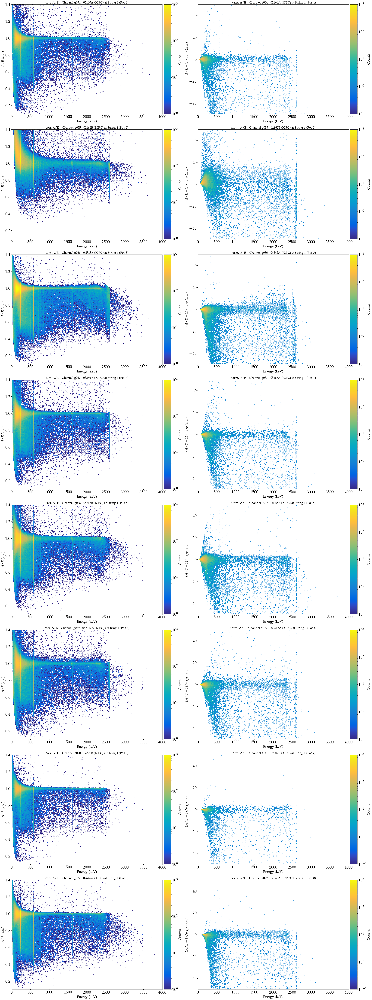

In [12]:
from re import A
from mpl_toolkits.axes_grid1 import make_axes_locatable

aoe_cor, aoe_norm = {}, {}

fig_corr, axes_corr = plt.subplots(len(channel_list),2, figsize=(30, 10*len(channel_list)))


for i, channel in enumerate(channel_list):
    # if channel != 'g038':
    #     continue
    
    axes = axes_corr[i]
    # get linear fit parameter
    pars_aoe_norm_ch, pars_aoe_sig_ch  = pars_aoe_norm[channel], pars_aoe_sig[channel]

    # load energy and amplitude
    e_cal_ch  = energy_ftp_calib[channel]
    a_ch    = amplitude_aftercuts[channel]
    aoe_ch = aoe[channel]
    
    # correct for linear dependence
    aoe_cor_ch = aoe_ch / (pars_aoe_norm_ch[0]*e_cal_ch + pars_aoe_norm_ch[1])
    aoe_norm_ch = (aoe_cor_ch-1) / exp_func(e_cal_ch, *pars_aoe_sig_ch)

    # save for later
    aoe_cor[channel], aoe_norm[channel] = aoe_cor_ch, aoe_norm_ch
    
    # plot corrected A/E as Hist2D

    divider0 = make_axes_locatable(axes[0])
    divider1 = make_axes_locatable(axes[1])
    cax0 = divider0.append_axes('right', size='5%', pad=0.1)
    cax1 = divider1.append_axes('right', size='5%', pad=0.1)

    im0 = axes[0].hist2d(e_cal_ch, aoe_cor_ch, bins=(500, 500), range=((0,4000),(0.1,1.4)), norm=mpl.colors.LogNorm(vmin=1, vmax=1e3), cmap=parula_map)

    axes[0].set_xlim(0, 4000)
    axes[0].set_ylim(0.1, 1.4)
    axes[0].set_ylabel("$A/E$ (a.u.)")
    axes[0].set_xlabel("Energy (keV)")
    axes[0].set_title('corr. A/E -- Channel {} - {}'.format(channel, label_listExt[channel]))

    fig_corr.colorbar(im0[3], cax=cax0, label='Counts')

    im1 = axes[1].hist2d(e_cal_ch, aoe_norm_ch, bins=(500, 5000), range=((0,4000),(-50,50)), norm=mpl.colors.LogNorm(vmin=1e-1, vmax=1e3), cmap=parula_map)

    axes[1].set_xlim(0, 4000)
    # axes[1].set_ylim(-2500, 2500)
    axes[1].set_ylabel("$(A/E-1)/ \sigma_{A/E}$ (a.u.)")
    axes[1].set_xlabel("Energy (keV)")
    axes[1].set_title('norm. A/E -- Channel {} - {}'.format(channel, label_listExt[channel]))

    fig_corr.colorbar(im1[3], cax=cax1, label='Counts')
fig_corr.tight_layout()
fig_corr.savefig(folder_figures_aoe + 'AllCH_AoE_cor-norm_AllFits.png', dpi=300)
    # break

### Get A/E cut for 90% of DEP surival effiency
Firstly, signal and background regions are defined for the DEP peak as a indicator peak for $Q_{\beta \beta}$ according to
- Region 1: \[DEP - $1 \cdot 4.5 \sigma$, DEP + $1 \cdot 4.5 \sigma$\] (peak region)
- Region 2: \[DEP - $2 \cdot 4.5 \sigma$, DEP - $1 \cdot 4.5 \sigma$\] (left side band, LSB)
- Region 3: \[DEP + $1 \cdot 4.5 \sigma$, DEP + $2 \cdot 4.5 \sigma$\] (right side band 1, RSB 1)
- Region 4: \[DEP + $2 \cdot 4.5 \sigma$, DEP + $3 \cdot 4.5 \sigma$\] (right side band 2, RSB 2)    

The corrected A/E values in these energy ranges are histogrammed and the resulting distribution in the peak region is corrected for the background by subtracting the distributions of the LSB and RSB regions.  
Finally, the cut value for A/E is calculated corresponds to that value for which 90% of the events in the DEP surrive. It is obtained by integrating the background-corrected A/E distribution of the DEP up to a value of 10% of the total integral.


Channel g034: Find low-side AoE cut for 90% 208-Tl DEP acceptance
Found FWHM DEP value of 2.12keV for channel g034
Optimal binning found with number of bins 100
Cut value:  -2.000


Cut value non corrected:  0.995


Channel g035: Find low-side AoE cut for 90% 208-Tl DEP acceptance
Found FWHM DEP value of 6.97keV for channel g035
Optimal binning found with number of bins 20
Cut value:  -0.629


Cut value non corrected:  0.999


Channel g036: Find low-side AoE cut for 90% 208-Tl DEP acceptance
Found FWHM DEP value of 3.17keV for channel g036
Optimal binning found with number of bins 60
Cut value:  -2.863


Cut value non corrected:  0.993


Channel g037: Find low-side AoE cut for 90% 208-Tl DEP acceptance
Found FWHM DEP value of 2.79keV for channel g037
Optimal binning found with number of bins 100
Cut value:  -2.431


Cut value non corrected:  0.993


Channel g038: Find low-side AoE cut for 90% 208-Tl DEP acceptance
Found FWHM DEP value of 2.43keV for channel g038
Optimal binning found w

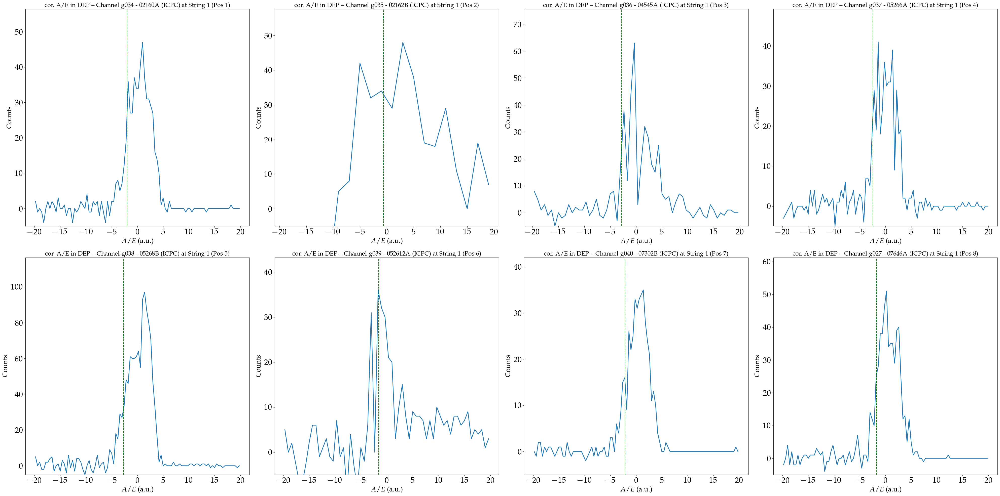

In [13]:
import matplotlib.colors as mcolors

n_rows, n_cols = 2, 4
fig_aoe_dep, ax_aoe_dep = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))
ax_aoe_dep = ax_aoe_dep.flatten()

aoe_cuts, aoe_noncorr_cuts = {}, {}

for i, channel in enumerate(channel_list):
    print("Channel {}: Find low-side AoE cut for {:.0f}% 208-Tl DEP acceptance".format(channel, 100*dep_acc))
    # get FWHM values for channel
    fwhm_dep = fwhm_dep_all[channel]
    print(f'Found FWHM DEP value of {fwhm_dep:.2f}keV for channel {channel}')

    # Set side bands and dep_line boundaries
    emin_low_band  = dep_line - 4*fwhm_dep
    emax_low_band  = dep_line - 2*fwhm_dep
    emin           = dep_line - 2*fwhm_dep
    emax           = dep_line + 2*fwhm_dep
    emin_high_band = dep_line + 2*fwhm_dep
    emax_high_band = dep_line + 4*fwhm_dep

    # Define the aoe_fin distrbutions
    aoe_fin_ch = aoe_norm[channel]
    e_cal_ch = energy_ftp_calib[channel]
    aoe_fin_bkg = [[],[],[]]
    aoe_fin_bkg[0] = aoe_fin_ch[(e_cal_ch>emin_low_band) & (e_cal_ch<emax_low_band)]
    aoe_fin_bkg[1] = aoe_fin_ch[(e_cal_ch>emin) & (e_cal_ch<emax)]
    aoe_fin_bkg[2] = aoe_fin_ch[(e_cal_ch>emin_high_band) & (e_cal_ch<emax_high_band)]

    n_bins = 100
    
    if channel == 'g035':
        n_bins = 20
    if channel == 'g036' or channel == 'g039':
        n_bins = 60

    # fill in bkg and signal histograms
    hist_bkg, _ = np.histogram(aoe_fin_bkg[0], bins=n_bins, range=[-20,20]) # LSB
    hist_sig, _ = np.histogram(aoe_fin_bkg[1], bins=n_bins, range=[-20,20]) # signal
    hist, bins  = np.histogram(aoe_fin_bkg[2], bins=n_bins, range=[-20,20]) # RSB 1
    hist_bkg = [x+y for x, y in zip(hist, hist_bkg)] # LSB + RSB 1
    bin_center = (bins[:-1] + bins[1:])/2


    # Background subtraction
    hist_sig = np.array([x-y for x, y in zip(hist_sig, hist_bkg)])

        
    print(f'Optimal binning found with number of bins {n_bins}')
    # Background-subtracted DEP aoe_fin distribution
    ax_aoe_dep[i].plot(bin_center, hist_sig, label='Bkg subtracted distribution')
    ax_aoe_dep[i].set_xlabel("$A/E$ (a.u.)")
    ax_aoe_dep[i].set_ylabel("Counts")
    ax_aoe_dep[i].set_title('cor. A/E in DEP -- Channel {} - {}'.format(channel, label_listExt[channel]))
    ax_aoe_dep[i].set_ylim(-5, 1.2*np.max(hist_sig))
    ax_aoe_dep[i].set_ylim(-5, 1.2*np.max(hist_sig))


    # generate cut value
    cut = 0
    sf = 0

    # total number of events in signal regions = total integral
    Ntot = np.sum(hist_sig)

    # iterate over bins and generate number of events
    # integrate up to value where integral is 1 - dep_acc ratio of the total integral (mostly 10%)
    dep_acc_reverse = 1.0 - dep_acc # 10%
    for bin in bin_center:
        share_total_integral = np.sum(hist_sig[bin_center < bin]) / Ntot # current integral
        if share_total_integral < dep_acc_reverse: # share < 10%
            low_bin = bin
            low_share_integral = share_total_integral
        if share_total_integral > dep_acc_reverse: # share > 10%
            high_bin = bin
            high_share_integral = share_total_integral
            break

    cut = low_bin + (high_bin-low_bin) * (dep_acc_reverse - low_share_integral) / (high_share_integral - low_share_integral) # low_bin + bin_width * <difference to 10% > * <difference between high and low share >
    
    ax_aoe_dep[i].vlines(cut, -5, 1.5*np.max(hist_sig), color='green', lw=1.5, linestyles='dashed', label=r'Cut value {cut:1.3f}')
    
    aoe_cuts[channel] = cut
    aoe_noncorr_cuts[channel] = (cut * exp_func(dep_line, *pars_aoe_sig[channel])) + 1
    
    print("Cut value: ",'{:1.3f}\n\n'.format(cut))
    print("Cut value non corrected: ",'{:1.3f}\n\n'.format(aoe_noncorr_cuts[channel]))

fig_aoe_dep.tight_layout()
fig_aoe_dep.savefig(folder_figures_aoe + 'AllCH_DEPcut_AoEnorm.pdf')


### Compute surrival fractions

### $Q_{\beta \beta}$
Get surrival effiency for $Q_{\beta \beta}$.

Channel g034: Calculate Qbb surrival fraction
Found FWHM Qbb value of 2.29keV for channel g034
-> Qbb 2039.04keV: surrival fraction = 29.98+-0.76%


Channel g035: Calculate Qbb surrival fraction
Found FWHM Qbb value of 7.87keV for channel g035
-> Qbb 2039.04keV: surrival fraction = 31.76+-0.53%


Channel g036: Calculate Qbb surrival fraction
Found FWHM Qbb value of 3.17keV for channel g036
-> Qbb 2039.04keV: surrival fraction = 26.82+-0.39%


Channel g037: Calculate Qbb surrival fraction
Found FWHM Qbb value of 3.08keV for channel g037
-> Qbb 2039.04keV: surrival fraction = 32.86+-0.66%


Channel g038: Calculate Qbb surrival fraction
Found FWHM Qbb value of 2.63keV for channel g038
-> Qbb 2039.04keV: surrival fraction = 36.73+-0.60%


Channel g039: Calculate Qbb surrival fraction
Found FWHM Qbb value of 4.21keV for channel g039
-> Qbb 2039.04keV: surrival fraction = 30.14+-0.59%


Channel g040: Calculate Qbb surrival fraction
Found FWHM Qbb value of 2.24keV for channel g040
-> Qbb 2039

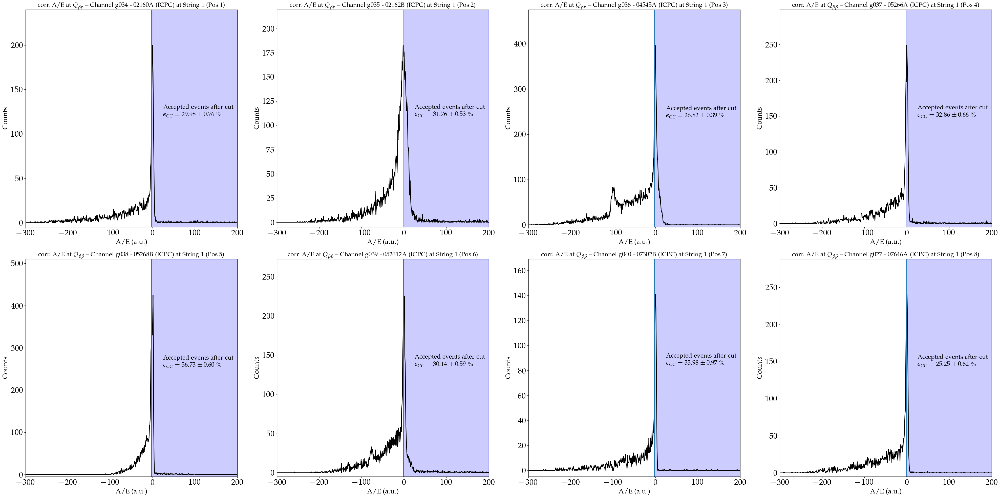

In [14]:
peak = q_bb

n_rows, n_cols = 2, 4
fig_qbb, ax_qbb = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))
ax_qbb = ax_qbb.flatten()

sfraction_qbb, sfraction_err_qbb = {}, {}

for i, channel in enumerate(channel_list):
    print("Channel {}: Calculate Qbb surrival fraction".format(channel))
    # get FWHM values for channel
    fwhm_qbb = fwhm_qbb_all[channel]
    print(f'Found FWHM Qbb value of {fwhm_qbb:.2f}keV for channel {channel}')

    # set peak boundaries, values from thesis Wagner S. 112
    emin           = peak - 35
    emax           = peak + 35

    # Define AoE distrbutions
    aoe_fin_ch = aoe_norm[channel]
    cut = aoe_cuts[channel]
    e_cal_ch = energy_ftp_calib[channel]
    aoe_bkg_ch = aoe_fin_ch[(e_cal_ch>emin) & (e_cal_ch<emax)]


    n_bins = 600

    # fill in bkg and signal histograms
    hist_sig, bins = np.histogram(aoe_bkg_ch, bins=n_bins, range=[-300,200]) # signal
    bin_center = bin_center = (bins[:-1] + bins[1:])/2

    hist_sig = np.array(hist_sig)


    # compute the survival fraction given the cut value
    Nacc = np.sum(hist_sig[bin_center > cut])
    Ntot = sum(hist_sig)
    if Nacc < 0: 
        Nacc = 0

    sf_qbb, sferr_qbb = Nacc / Ntot, 1./Ntot * np.sqrt( Nacc - Nacc**2 / Ntot)

    y_min_sig, y_max_sig = 0, np.max(hist_sig) * 1.2


    ax_qbb[i].set_xlim([-300,200])
    ax_qbb[i].set_ylim(y_min_sig, y_max_sig)
    ax_qbb[i].plot(bin_center, hist_sig, color='black')
    ax_qbb[i].vlines(cut, -20, 1.5*np.max(hist_sig))
    ax_qbb[i].fill_between(bin_center, 0,1, where=np.logical_and(bin_center >= cut, bin_center <= 200), color='blue', alpha=0.2, transform=ax_qbb[i].get_xaxis_transform())
    ax_qbb[i].text(25, y_max_sig / 2, 'Accepted events after cut \n $\epsilon_{{CC}} = {:.2f} \pm {:.2f}$ \%'.format(sf_qbb * 100, sferr_qbb * 100), fontsize=18)
    ax_qbb[i].set_xlabel("A/E (a.u.)")
    ax_qbb[i].set_ylabel("Counts")
    ax_qbb[i].set_title("corr. A/E at $Q_{{ \\beta \\beta}}$ -- Channel {} - {}".format(channel, label_listExt[channel]))
    ax_qbb[i].set_ylim(-5, 1.2*np.max(hist_sig))


    # compute the survival fraction given the cut value
    Nacc = np.sum(hist_sig[bin_center > cut])
    Ntot = sum(hist_sig)
    if Nacc < 0: 
        Nacc = 0
    sf_qbb, sferr_qbb = Nacc / Ntot, 1./Ntot * np.sqrt( Nacc - Nacc**2 / Ntot)
    print('-> Qbb {:.2f}keV: surrival fraction = {:.2f}+-{:.2f}%\n\n'.format(peak, sf_qbb * 100, sferr_qbb * 100) )
    sfraction_qbb[channel], sfraction_err_qbb[channel] = sf_qbb * 100, sferr_qbb * 100
    
    
fig_qbb.tight_layout()
fig_qbb.savefig(folder_figures_aoe + 'AllCH_Qbbcut_AoEnorm_surrivalFraction.pdf')


### FEP

Channel g034: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 2.49keV for channel g034
-> 2614.51keV FEP: surrival fraction = 7.52+-0.21%


Channel g035: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 8.89keV for channel g035
-> 2614.51keV FEP: surrival fraction = 23.47+-0.40%


Channel g036: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 3.17keV for channel g036
-> 2614.51keV FEP: surrival fraction = 7.46+-0.23%


Channel g037: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 3.41keV for channel g037
-> 2614.51keV FEP: surrival fraction = 8.85+-0.27%


Channel g038: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 2.86keV for channel g038
-> 2614.51keV FEP: surrival fraction = 17.09+-0.22%


Channel g039: Calculate 2614.511keV peak surrival fraction
Found FWHM FEP value of 4.61keV for channel g039
-> 2614.51keV FEP: surrival fraction = 13.51+-0.33%


Channel g040: Calculate 2614.51

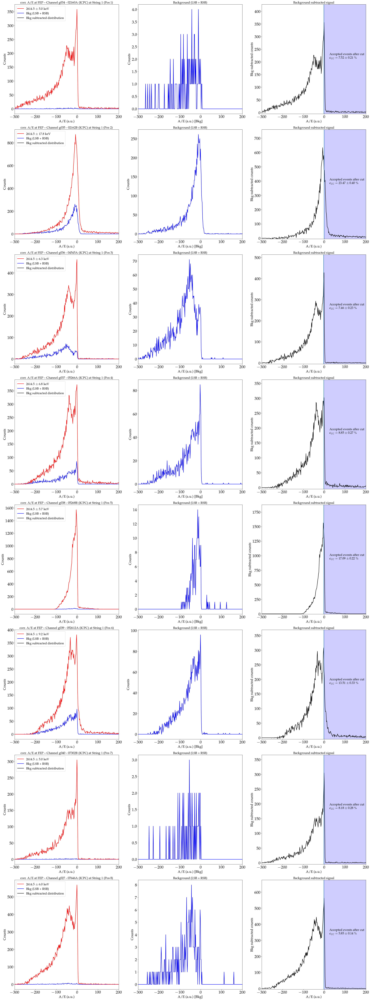

In [15]:
peak = peaks_FEP

n_rows, n_cols = len(channel_list), 3
fig_fep, ax_fep = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))

sfraction_fep, sfraction_err_fep = {}, {}

for i, channel in enumerate(channel_list):

    axes = ax_fep[i]
    print("Channel {}: Calculate {}keV peak surrival fraction".format(channel, peak))
    # get FWHM values for channel
    fwhm_fep = fwhm_fep_all[channel]
    print(f'Found FWHM FEP value of {fwhm_fep:.2f}keV for channel {channel}')


    # Define AoE distrbutions
    aoe_fin_ch = aoe_norm[channel]
    cut = aoe_cuts[channel]
    e_cal_ch = energy_ftp_calib[channel]

    # set side bands and peak boundaries
    emin_low_band  = peak - 4*fwhm_fep
    emax_low_band  = peak - 2*fwhm_fep
    emin           = peak - 2*fwhm_fep
    emax           = peak + 2*fwhm_fep
    emin_high_band = peak + 2*fwhm_fep
    emax_high_band = peak + 4*fwhm_fep

    # Define AoE distrbutions
    aoe_bkg = [[],[],[]]

    aoe_bkg[0] = aoe_fin_ch[(e_cal_ch>emin) & (e_cal_ch<emax)]
    aoe_bkg[1] = aoe_fin_ch[(e_cal_ch>emin_low_band) & (e_cal_ch<emax_low_band)]
    aoe_bkg[2] = aoe_fin_ch[(e_cal_ch>emin_high_band) & (e_cal_ch<emax_high_band)]


    n_bins = 300

    # fill in bkg and signal histograms
    hist_sig, _ = np.histogram(aoe_bkg[0], bins=n_bins, range=[-300,200]) # signal
    hist_bkg, _ = np.histogram(aoe_bkg[1], bins=n_bins, range=[-300,200]) # LSB
    hist, bins  = np.histogram(aoe_bkg[2], bins=n_bins, range=[-300,200]) # RSB
    hist_bkg = [x+y for x, y in zip(hist, hist_bkg)] # LSB + RSB
    bin_center = bin_center = (bins[:-1] + bins[1:])/2


    axes[0].plot(bin_center, hist_bkg, color='b')
    axes[0].plot(bin_center, hist_sig, color='r', label='{:4.1f} $\pm$ {:2.1f} keV'.format(peak, 2*fwhm_fep) )
    axes[0].set_xlim([-300,200])
    axes[0].set_xlabel("A/E (a.u.)")
    axes[0].set_ylabel("Counts")
    axes[0].set_title("corr. A/E at FEP -- Channel {} - {}".format(channel, label_listExt[channel]))

    axes[1].plot(bin_center, hist_bkg, color='b', label='Bkg (LSB + RSB)')
    axes[1].set_xlim([-300,200])
    axes[1].set_xlabel("A/E (a.u.) [Bkg]")
    axes[1].set_ylabel("Counts")
    axes[1].set_title("Background (LSB + RSB)")


    # Perform side band subtraction
    hist_bkg = np.array(hist_bkg)
    hist_sig = np.array(hist_sig)

    # compute the survival fraction given the cut value
    Nacc = np.sum(hist_sig[bin_center > cut])
    Nacc_bkg = np.sum(hist_bkg[bin_center > cut])
    Ntot = np.sum(hist_sig)
    Ntot_bkg = np.sum(hist_bkg)
    if Nacc < 0: 
        Nacc = 0
    if Nacc_bkg < 0:
        Nacc_bkg = 0
    Nrej = Ntot - Nacc
    Nrej_bkg = Ntot_bkg - Nacc_bkg



    sf_fep = (Nacc - Nacc_bkg) / (Ntot - Ntot_bkg) 
    sferr_fep = np.sqrt( (Nrej - Nrej_bkg)**2 * (Nacc + Nacc_bkg) + (Nacc - Nacc_bkg)**2 * (Nrej + Nrej_bkg) ) / (Ntot - Ntot_bkg)**2
    print('-> {:.2f}keV FEP: surrival fraction = {:.2f}+-{:.2f}%\n\n'.format(peak, sf_fep * 100, sferr_fep * 100) )
    sfraction_fep[channel], sfraction_err_fep[channel] = sf_fep * 100, sferr_fep * 100
    
    
    # perform side band subtraction
    hist_sig = [x-y for x, y in zip(hist_sig, hist_bkg)]

    y_min_sig, y_max_sig = 0, np.max(hist_sig) * 1.2


    axes[2].set_xlim([-300,200])
    axes[2].set_ylim(y_min_sig, y_max_sig)
    axes[2].plot(bin_center, hist_sig, color='black', label='Bkg subtracted distribution')
    axes[2].vlines(cut, -20, 1.5*np.max(hist_sig))
    axes[2].fill_between(bin_center, 0,1, where=np.logical_and(bin_center >= cut, bin_center <= 200), color='blue', alpha=0.2, transform=axes[2].get_xaxis_transform())
    axes[2].text(25, y_max_sig / 2, 'Accepted events after cut \n $\epsilon_{{CC}} = {:.2f} \pm {:.2f}$ \%'.format(sf_fep * 100, sferr_fep * 100), fontsize=18)
    axes[2].set_xlabel("A/E (a.u.)")
    axes[2].set_ylabel("Bkg subtracted counts")
    axes[2].set_title("Background subtracted signal")
    axes[2].set_ylim(-5, 1.2*np.max(hist_sig))
    
    handles, labels = [], []
    for a in axes:
        hand, lab = a.get_legend_handles_labels()
        handles.append(hand[0])
        labels.append(lab[0])
    axes[0].legend(handles, labels)
fig_fep.tight_layout()
fig_fep.savefig(folder_figures_aoe + 'AllCH_FEPcut_AoEnorm_surrivalFraction.pdf')

    # break

### SEP

Channel g034: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 2.32keV for channel g034
-> 2103.51keV SEP: surrival fraction = 5.81+-1.13%


Channel g035: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 7.99keV for channel g035
-> 2103.51keV SEP: surrival fraction = 21.16+-2.30%


Channel g036: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 3.17keV for channel g036
-> 2103.51keV SEP: surrival fraction = 8.81+-2.05%


Channel g037: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 3.11keV for channel g037
-> 2103.51keV SEP: surrival fraction = 5.96+-1.84%


Channel g038: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 2.65keV for channel g038
-> 2103.51keV SEP: surrival fraction = 16.28+-1.00%


Channel g039: Calculate 2103.511keV peak surrival fraction
Found FWHM SEP value of 4.25keV for channel g039
-> 2103.51keV SEP: surrival fraction = 13.41+-2.42%


Channel g040: Calculate 2103.51

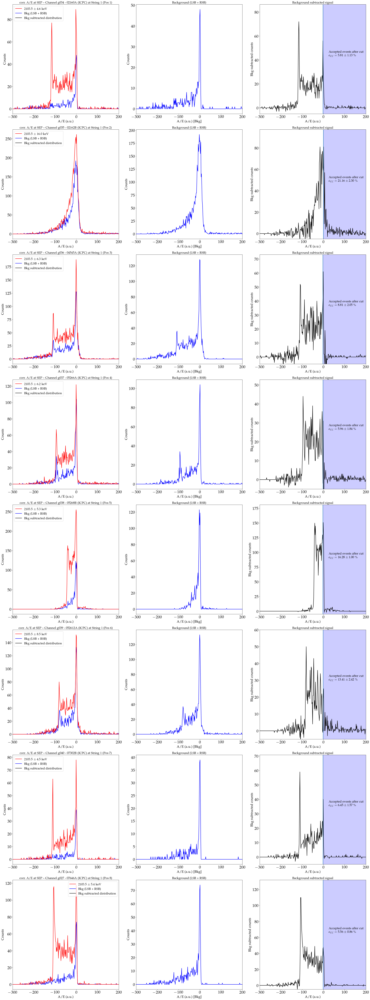

In [16]:
peak = peaks_SEP

n_rows, n_cols = len(channel_list), 3
fig_sep, ax_sep = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))

sfraction_sep, sfraction_err_sep = {}, {}


for i, channel in enumerate(channel_list):

    axes = ax_sep[i]
    print("Channel {}: Calculate {}keV peak surrival fraction".format(channel, peak))
    # get FWHM values for channel
    fwhm_sep = fwhm_sep_all[channel]
    print(f'Found FWHM SEP value of {fwhm_sep:.2f}keV for channel {channel}')


    # Define AoE distrbutions
    aoe_fin_ch = aoe_norm[channel]
    cut = aoe_cuts[channel]
    e_cal_ch = energy_ftp_calib[channel]

    # set side bands and peak boundaries
    emin_low_band  = peak - 4*fwhm_sep
    emax_low_band  = peak - 2*fwhm_sep
    emin           = peak - 2*fwhm_sep
    emax           = peak + 2*fwhm_sep
    emin_high_band = peak + 2*fwhm_sep
    emax_high_band = peak + 4*fwhm_sep

    # Define AoE distrbutions
    aoe_bkg = [[],[],[]]

    aoe_bkg[0] = aoe_fin_ch[(e_cal_ch>emin) & (e_cal_ch<emax)]
    aoe_bkg[1] = aoe_fin_ch[(e_cal_ch>emin_low_band) & (e_cal_ch<emax_low_band)]
    aoe_bkg[2] = aoe_fin_ch[(e_cal_ch>emin_high_band) & (e_cal_ch<emax_high_band)]


    n_bins = 300

    # fill in bkg and signal histograms
    hist_sig, _ = np.histogram(aoe_bkg[0], bins=n_bins, range=[-300,200]) # signal
    hist_bkg, _ = np.histogram(aoe_bkg[1], bins=n_bins, range=[-300,200]) # LSB
    hist, bins  = np.histogram(aoe_bkg[2], bins=n_bins, range=[-300,200]) # RSB
    hist_bkg = [x+y for x, y in zip(hist, hist_bkg)] # LSB + RSB
    bin_center = bin_center = (bins[:-1] + bins[1:])/2


    axes[0].plot(bin_center, hist_bkg, color='b')
    axes[0].plot(bin_center, hist_sig, color='r', label='{:4.1f} $\pm$ {:2.1f} keV'.format(peak, 2*fwhm_sep) )
    axes[0].set_xlim([-300,200])
    axes[0].set_xlabel("A/E (a.u.)")
    axes[0].set_ylabel("Counts")
    axes[0].set_title("corr. A/E at SEP -- Channel {} - {}".format(channel, label_listExt[channel]))

    axes[1].plot(bin_center, hist_bkg, color='b', label='Bkg (LSB + RSB)')
    axes[1].set_xlim([-300,200])
    axes[1].set_xlabel("A/E (a.u.) [Bkg]")
    axes[1].set_ylabel("Counts")
    axes[1].set_title("Background (LSB + RSB)")


    # Perform side band subtraction
    hist_bkg = np.array(hist_bkg)
    hist_sig = np.array(hist_sig)

    # compute the survival fraction given the cut value
    Nacc = np.sum(hist_sig[bin_center > cut])
    Nacc_bkg = np.sum(hist_bkg[bin_center > cut])
    Ntot = np.sum(hist_sig)
    Ntot_bkg = np.sum(hist_bkg)
    if Nacc < 0: 
        Nacc = 0
    if Nacc_bkg < 0:
        Nacc_bkg = 0
    Nrej = Ntot - Nacc
    Nrej_bkg = Ntot_bkg - Nacc_bkg



    sf_sep = (Nacc - Nacc_bkg) / (Ntot - Ntot_bkg) 
    sferr_sep = np.sqrt( (Nrej - Nrej_bkg)**2 * (Nacc + Nacc_bkg) + (Nacc - Nacc_bkg)**2 * (Nrej + Nrej_bkg) ) / (Ntot - Ntot_bkg)**2
    print('-> {:.2f}keV SEP: surrival fraction = {:.2f}+-{:.2f}%\n\n'.format(peak, sf_sep * 100, sferr_sep * 100) )
    sfraction_sep[channel], sfraction_err_sep[channel] = sf_sep * 100, sferr_sep * 100
    
    # perform side band subtraction
    hist_sig = [x-y for x, y in zip(hist_sig, hist_bkg)]

    y_min_sig, y_max_sig = 0, np.max(hist_sig) * 1.2


    axes[2].set_xlim([-300,200])
    axes[2].set_ylim(y_min_sig, y_max_sig)
    axes[2].plot(bin_center, hist_sig, color='black', label='Bkg subtracted distribution')
    axes[2].vlines(cut, -20, 1.5*np.max(hist_sig))
    axes[2].fill_between(bin_center, 0,1, where=np.logical_and(bin_center >= cut, bin_center <= 200), color='blue', alpha=0.2, transform=axes[2].get_xaxis_transform())
    axes[2].text(25, y_max_sig / 2, 'Accepted events after cut \n $\epsilon_{{CC}} = {:.2f} \pm {:.2f}$ \%'.format(sf_sep * 100, sferr_sep * 100), fontsize=18)
    axes[2].set_xlabel("A/E (a.u.)")
    axes[2].set_ylabel("Bkg subtracted counts")
    axes[2].set_title("Background subtracted signal")
    axes[2].set_ylim(-5, 1.2*np.max(hist_sig))
    
    handles, labels = [], []
    for a in axes:
        hand, lab = a.get_legend_handles_labels()
        handles.append(hand[0])
        labels.append(lab[0])
    axes[0].legend(handles, labels)
fig_sep.tight_layout()
fig_sep.savefig(folder_figures_aoe + 'AllCH_SEPcut_AoEnorm_surrivalFraction.pdf')

    # break

### DEP

Channel g034: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 2.12keV for channel g034
-> 1592.51keV DEP: surrival fraction = 91.96+-5.32%


Channel g035: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 6.97keV for channel g035
-> 1592.51keV DEP: surrival fraction = -17.15+-9.68%


Channel g036: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 3.17keV for channel g036
-> 1592.51keV DEP: surrival fraction = 37.44+-10.00%


Channel g037: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 2.79keV for channel g037
-> 1592.51keV DEP: surrival fraction = 91.27+-8.29%


Channel g038: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 2.43keV for channel g038
-> 1592.51keV DEP: surrival fraction = 89.06+-3.11%


Channel g039: Calculate DEP at 1592.511keV surrival fraction
Found FWHM DEP value of 3.87keV for channel g039
-> 1592.51keV DEP: surrival fraction = 46.21+-6.63%


Channel g040: 

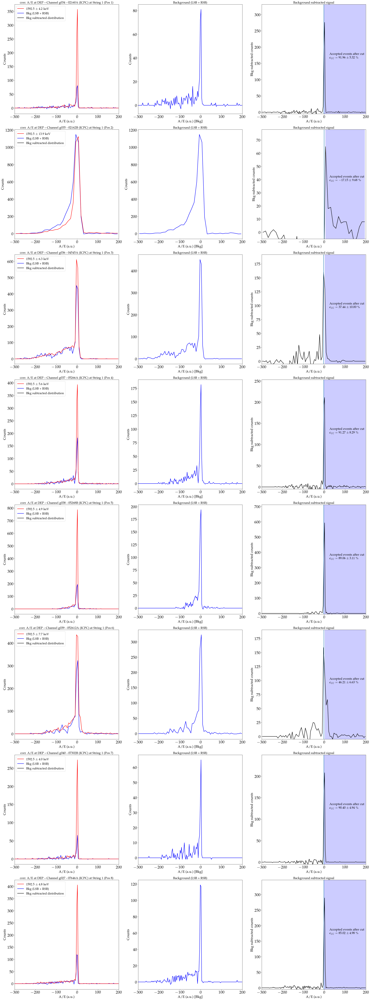

In [17]:
peak = dep_line

n_rows, n_cols = len(channel_list), 3
fig_dep, ax_dep = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols*10, n_rows*10))

sfraction_dep, sfraction_err_dep = {}, {}

for i, channel in enumerate(channel_list):

    axes = ax_dep[i]
    print("Channel {}: Calculate DEP at {}keV surrival fraction".format(channel, peak))
    # get FWHM values for channel
    fwhm_dep = fwhm_dep_all[channel]
    print(f'Found FWHM DEP value of {fwhm_dep:.2f}keV for channel {channel}')


    # Define AoE distrbutions
    aoe_fin_ch = aoe_norm[channel]
    cut = aoe_cuts[channel]
    e_cal_ch = energy_ftp_calib[channel]

    # set side bands and peak boundaries
    emin_low_band     = peak - 4*fwhm_dep
    emax_low_band     = peak - 2*fwhm_dep
    emin              = peak - 2*fwhm_dep
    emax              = peak + 2*fwhm_dep
    emin_high_band    = peak + 2*fwhm_dep
    emax_high_band    = peak + 4*fwhm_dep
    emin_highest_band = peak + 4*fwhm_dep
    emax_highest_band = peak + 6*fwhm_dep


    # Define AoE distrbutions
    aoe_bkg = [[],[],[],[]]

    aoe_bkg[0] = aoe_fin_ch[(e_cal_ch>emin) & (e_cal_ch<emax)] # peak signal
    aoe_bkg[1] = aoe_fin_ch[(e_cal_ch>emin_low_band) & (e_cal_ch<emax_low_band)] # LSB
    aoe_bkg[2] = aoe_fin_ch[(e_cal_ch>emin_high_band) & (e_cal_ch<emax_high_band)] # RSB 1
    aoe_bkg[3] = aoe_fin_ch[(e_cal_ch>emin_highest_band) & (e_cal_ch<emax_highest_band)] # RSB 2

    n_bins = 150
    
    if channel == 'g035':
        n_bins = 40
    if channel == 'g036' or channel == 'g039':
        n_bins = 80

    # fill in bkg and signal histograms
    hist_sig, _ = np.histogram(aoe_bkg[0], bins=n_bins, range=[-300,200]) # signal
    hist_bkgL, _ = np.histogram(aoe_bkg[1], bins=n_bins, range=[-300,200]) # LSB
    hist_bkgR1, _  = np.histogram(aoe_bkg[2], bins=n_bins, range=[-300,200]) # RSB_1
    hist_bkgR2, bins = np.histogram(aoe_bkg[3], bins=n_bins, range=[-300,200]) # RSB_1
    hist_bkg = [x+ 2*y - z for x, y, z in zip(hist_bkgL, hist_bkgR1, hist_bkgR2)] # LSB + 2* RSB_1 - RSB_2
    bin_center = (bins[:-1] + bins[1:])/2

    axes[0].plot(bin_center, hist_bkg, color='b')
    axes[0].plot(bin_center, hist_sig, color='r', label='{:4.1f} $\pm$ {:2.1f} keV'.format(peak, 2*fwhm_dep) )
    axes[0].set_xlim([-300,200])
    axes[0].set_xlabel("A/E (a.u.)")
    axes[0].set_ylabel("Counts")
    axes[0].set_title("corr. A/E at DEP -- Channel {} - {}".format(channel, label_listExt[channel]))


    axes[1].plot(bin_center, hist_bkg, color='b', label='Bkg (LSB + RSB)')
    axes[1].set_xlim([-300,200])
    axes[1].set_xlabel("A/E (a.u.) [Bkg]")
    axes[1].set_ylabel("Counts")
    axes[1].set_title("Background (LSB + RSB)")


    # Perform side band subtraction
    hist_bkg = np.array(hist_bkg)
    hist_sig = np.array(hist_sig)

    # compute the survival fraction given the cut value
    Nacc = np.sum(hist_sig[bin_center > cut])
    Nacc_bkg = np.sum(hist_bkg[bin_center > cut])
    Nacc_bkgL = np.sum(hist_bkgL[bin_center > cut])
    Nacc_bkgR1 = np.sum(hist_bkgR1[bin_center > cut])
    Nacc_bkgR2 = np.sum(hist_bkgR2[bin_center > cut])

    Ntot = np.sum(hist_sig)
    Ntot_bkg = np.sum(hist_bkg)

    if Nacc < 0: 
        Nacc = 0
    if Nacc_bkg < 0:
        Nacc_bkg = 0

    Nrej = Ntot - Nacc
    Nrej_bkg = Ntot_bkg - Nacc_bkg
    Nrej_bkgL = np.sum(hist_bkgL[bin_center <= cut])
    Nrej_bkgR1 = np.sum(hist_bkgR1[bin_center <= cut])
    Nrej_bkgR2 = np.sum(hist_bkgR2[bin_center <= cut])

    sf_dep = (Nacc - Nacc_bkg) / (Ntot - Ntot_bkg) 
    sferr_dep = np.sqrt( (Nrej - Nrej_bkg)**2 * (Nacc + Nacc_bkgL + 4*Nacc_bkgR1 + Nacc_bkgR2) + (Nacc - Nacc_bkg)**2 * (Nrej + Nrej_bkgL + 4*Nrej_bkgR1 + Nrej_bkgR2) ) / (Ntot - Ntot_bkg)**2
    print('-> {:.2f}keV DEP: surrival fraction = {:.2f}+-{:.2f}%\n\n'.format(peak, sf_dep * 100, sferr_dep * 100) )
    sfraction_dep[channel], sfraction_err_dep[channel] = sf_dep * 100, sferr_dep * 100
    
    
    # perform side band subtraction
    hist_sig = [x-y for x, y in zip(hist_sig, hist_bkg)]

    y_min_sig, y_max_sig = 0, np.max(hist_sig) * 1.2


    axes[2].set_xlim([-300,200])
    axes[2].set_ylim(y_min_sig, y_max_sig)
    axes[2].plot(bin_center, hist_sig, color='black', label='Bkg subtracted distribution')
    axes[2].vlines(cut, -20, 1.5*np.max(hist_sig))
    axes[2].fill_between(bin_center, 0,1, where=np.logical_and(bin_center >= cut, bin_center <= 200), color='blue', alpha=0.2, transform=axes[2].get_xaxis_transform())
    axes[2].text(25, y_max_sig / 2, 'Accepted events after cut \n $\epsilon_{{CC}} = {:.2f} \pm {:.2f}$ \%'.format(sf_dep * 100, sferr_dep * 100), fontsize=18)
    axes[2].set_xlabel("A/E (a.u.)")
    axes[2].set_ylabel("Bkg subtracted counts")
    axes[2].set_title("Background subtracted signal")
    axes[2].set_ylim(-5, 1.2*np.max(hist_sig))
    
    handles, labels = [], []
    for a in axes:
        hand, lab = a.get_legend_handles_labels()
        handles.append(hand[0])
        labels.append(lab[0])
    axes[0].legend(handles, labels)
fig_dep.tight_layout()
fig_dep.savefig(folder_figures_aoe + 'AllCH_DEPcut_AoEnorm_surrivalFraction.pdf')


### Write `config.ini`

In [18]:
write_config = True
if write_config:
    config.read(config_file)
    config_file_bck_tier3 = project_folder + 'tier3/string1/BCK_config_tier3_aoe.ini'
    if not os.path.isfile(config_file_bck_tier3):
        print('INFO: Write TIER3 backup config to {}'.format(config_file_bck_tier3))
        config.write(open(config_file_bck_tier3, 'w'))


    for section in config:
        if section.startswith("TIER3/g"):
            channel = section[-4:]
            if channel not in channel_list:
                continue
            print("INFO: Write channel {}".format(channel))
            
            try:
                config[section]['dep'].add_after.option('pars_aoe_sig0', str(pars_aoe_sig[channel][0]))
                config[section]['dep'].add_after.option('pars_aoe_sig1', str(pars_aoe_sig[channel][1]))
                config[section]['dep'].add_after.option('pars_aoe_norm0', str(pars_aoe_norm[channel][0]))
                config[section]['dep'].add_after.option('pars_aoe_norm1', str(pars_aoe_norm[channel][1]))
                # config[section]['dep'].add_after.option('aoe_cut', str(aoe_noncorr_cuts[channel]))
                config[section]['dep'].add_after.option('aoe_cut_corr', str(aoe_cuts[channel]))
                # config[section]['dep'].add_after.option('sfraction_dep', str(sfraction_dep[channel]))
                # config[section]['dep'].add_after.option('sfraction_err_dep', str(sfraction_err_dep[channel]))
                # config[section]['dep'].add_after.option('sfraction_sep', str(sfraction_sep[channel]))
                # config[section]['dep'].add_after.option('sfraction_err_sep', str(sfraction_err_sep[channel]))
                # config[section]['dep'].add_after.option('sfraction_fep', str(sfraction_fep[channel]))
                # config[section]['dep'].add_after.option('sfraction_err_fep', str(sfraction_err_fep[channel]))
                # config[section]['dep'].add_after.option('sfraction_qbb', str(sfraction_qbb[channel]))
                # config[section]['dep'].add_after.option('sfraction_err_qbb', str(sfraction_err_qbb[channel]))
            except:
                config[section]['pars_aoe_sig0'].value  = str(pars_aoe_sig[channel][0])
                config[section]['pars_aoe_sig1'].value  = str(pars_aoe_sig[channel][1])
                config[section]['pars_aoe_norm0'].value = str(pars_aoe_norm[channel][0])
                config[section]['pars_aoe_norm1'].value = str(pars_aoe_norm[channel][1])
                config[section]['aoe_cut'].value = str(aoe_noncorr_cuts[channel])
                config[section]['aoe_cut_corr'].value = str(aoe_cuts[channel])
                config[section]['sfraction_dep'].value = str(sfraction_dep[channel])
                config[section]['sfraction_err_dep'].value =  str(sfraction_err_dep[channel])
                config[section]['sfraction_sep'].value = str(sfraction_sep[channel])
                config[section]['sfraction_err_sep'].value =  str(sfraction_err_sep[channel])
                config[section]['sfraction_fep'].value = str(sfraction_fep[channel])
                config[section]['sfraction_err_fep'].value =  str(sfraction_err_fep[channel])
                config[section]['sfraction_qbb'].value = str(sfraction_qbb[channel])
                config[section]['sfraction_err_qbb'].value =  str(sfraction_err_qbb[channel])
    config.write(open(config_file, 'w'))

INFO: Write channel g034
INFO: Write channel g035
INFO: Write channel g036
INFO: Write channel g037
INFO: Write channel g038
INFO: Write channel g039
INFO: Write channel g040
INFO: Write channel g027
